In [1]:
# import required libraries
import torch
import cv2
import pandas as pd
import numpy as np

In [2]:
# load our custom trained model
model = torch.hub.load('ultralytics/yolov5', 'custom', path = './yolov5m.pt')

Using cache found in C:\Users\prajwalj/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-1-27 Python-3.9.13 torch-1.13.1+cpu CPU

Fusing layers... 
Model summary: 212 layers, 20905467 parameters, 0 gradients
Adding AutoShape... 


In [3]:
# the path of the first image in which the logo is clearly visible
FOLDER_PATH = "./video_frames/"

In [4]:
# this dictionary will contain the co-ordinates of the bounding box
# we are mainly interested in the 4 co-ordinates: xmin, ymin, xmax, ymax
# this dictionary will contain xmin, ymin, etc as keys and the values
# associated with them will be in pixels.
bounding_box = None

In [5]:
# run the custom yolo model on this image and store results
results = model(FOLDER_PATH + str(1) + ".png")

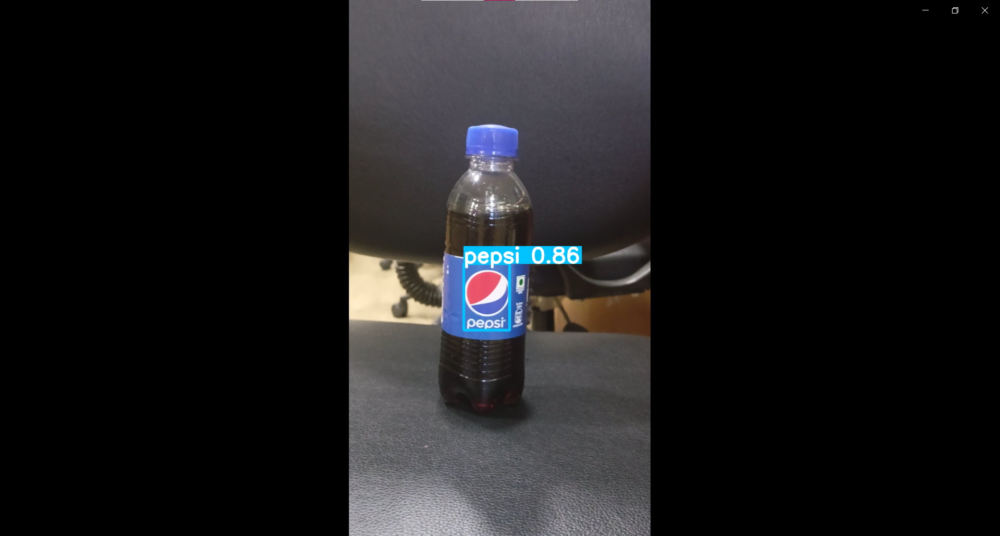

In [6]:
results.show()

In [32]:
for box in results.xyxy[0]: 
    xB = int(box[2])
    xA = int(box[0])
    yB = int(box[3])
    yA = int(box[1])

    w = xB - xA
    h = yB - yA

    bounding_box = (xA, yA, xB, yB)

    #roi_corners = np.array([[(xA, yA - h), (xA, yA), (xB, yB + h), (xB, yB)]], dtype=np.int32)
    print(bounding_box)
    break



(885, 506, 988, 630)


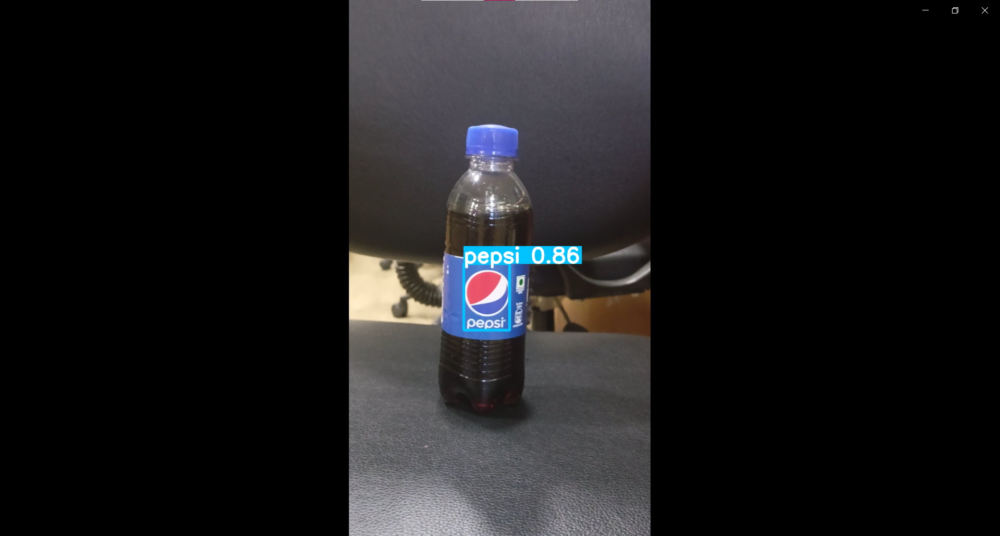

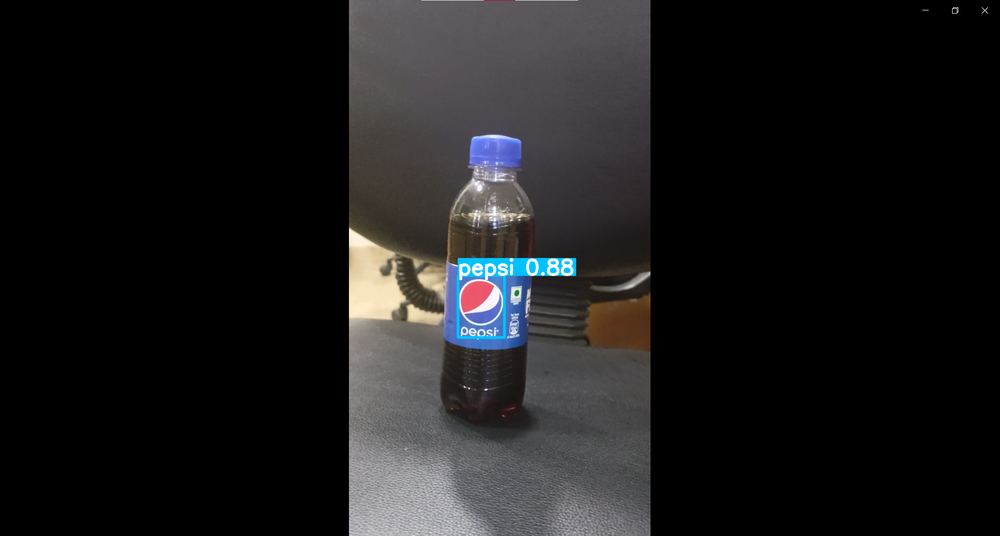

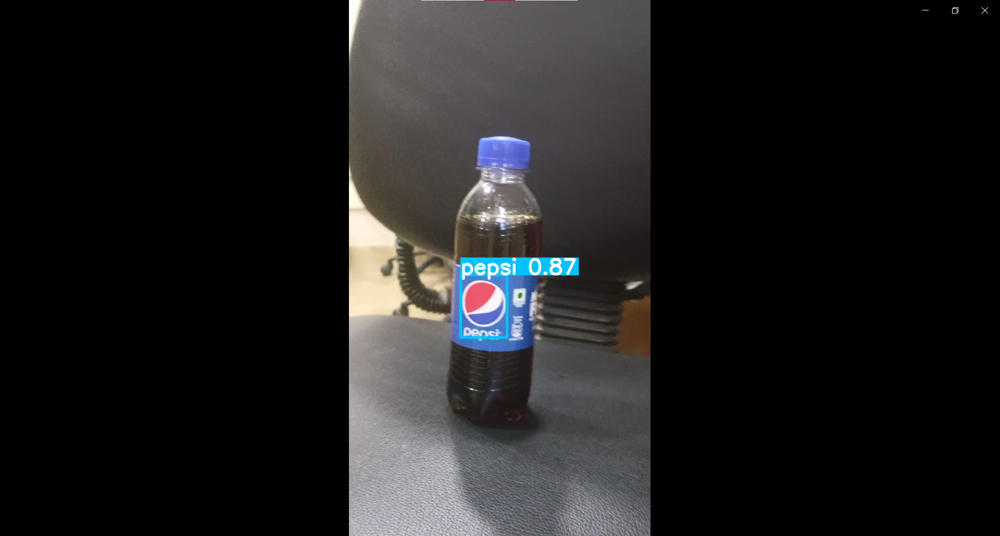

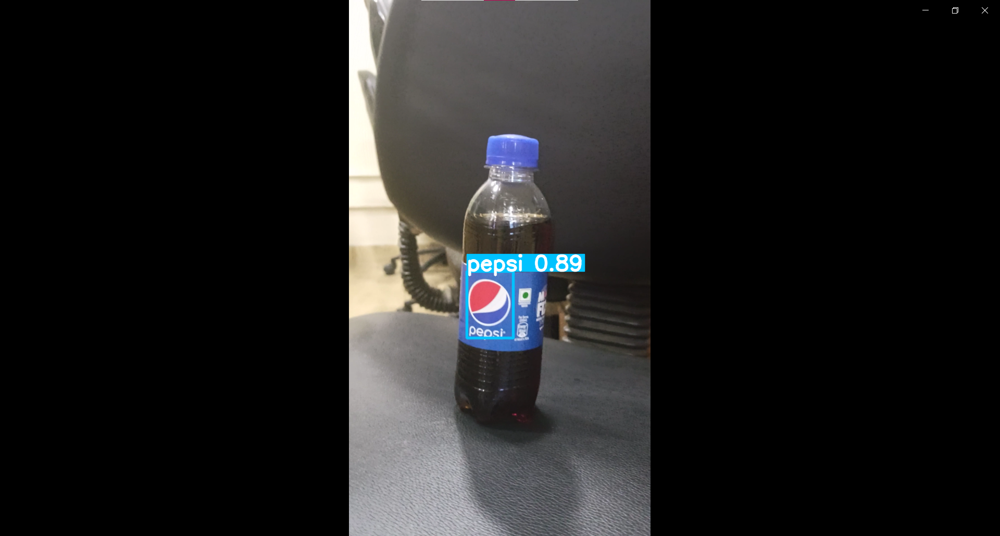

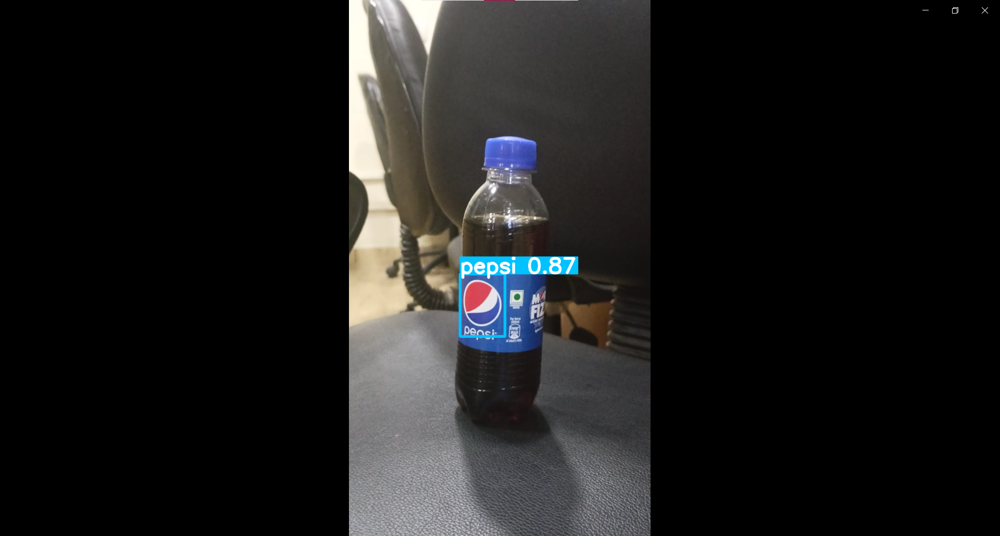

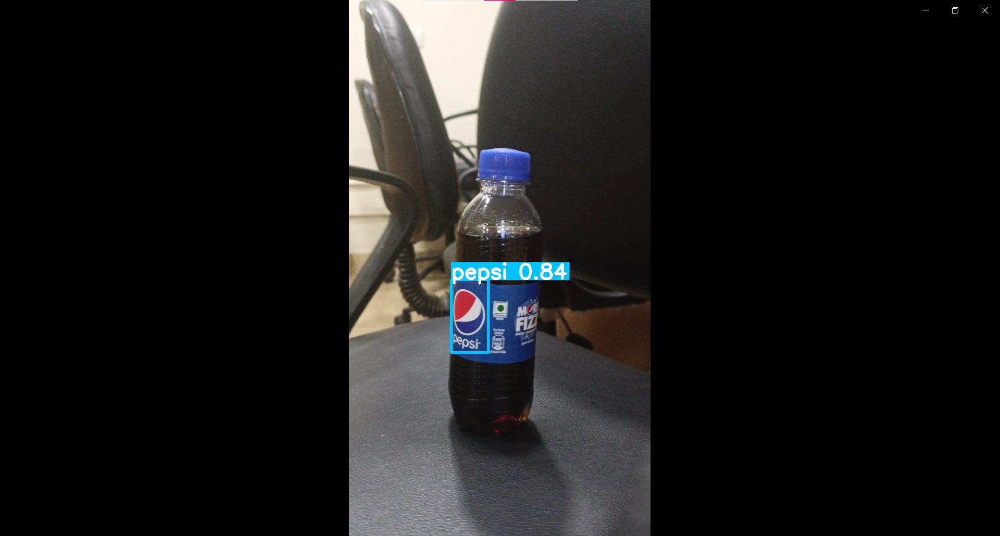

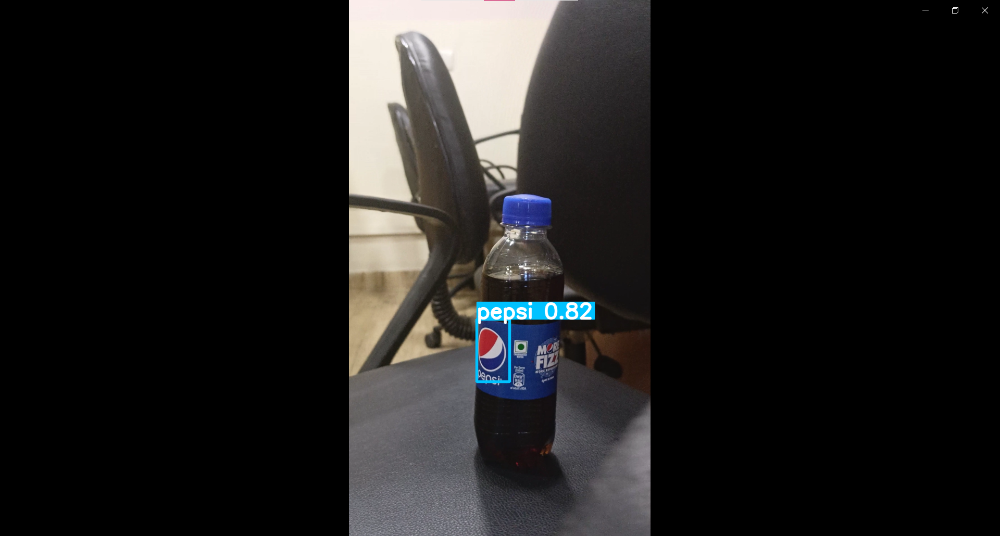

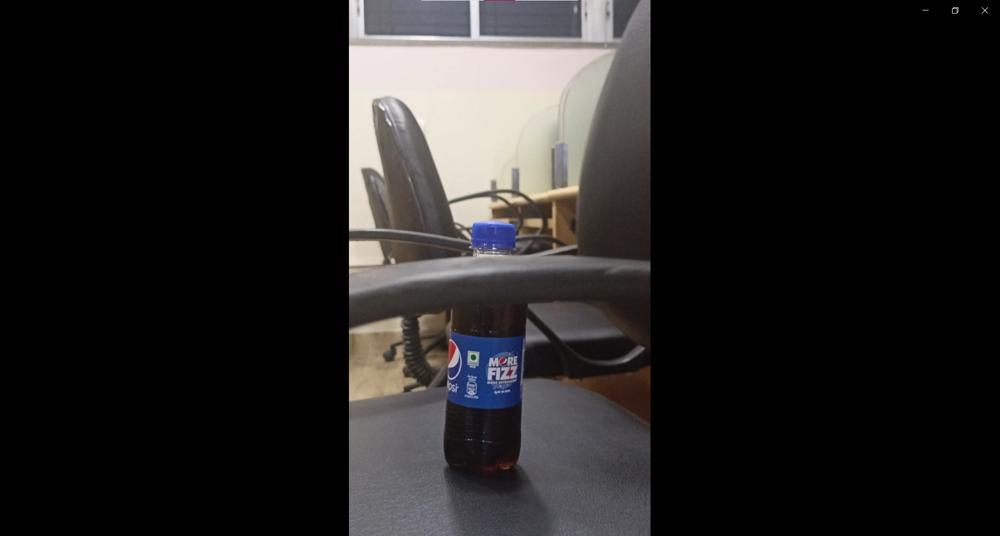

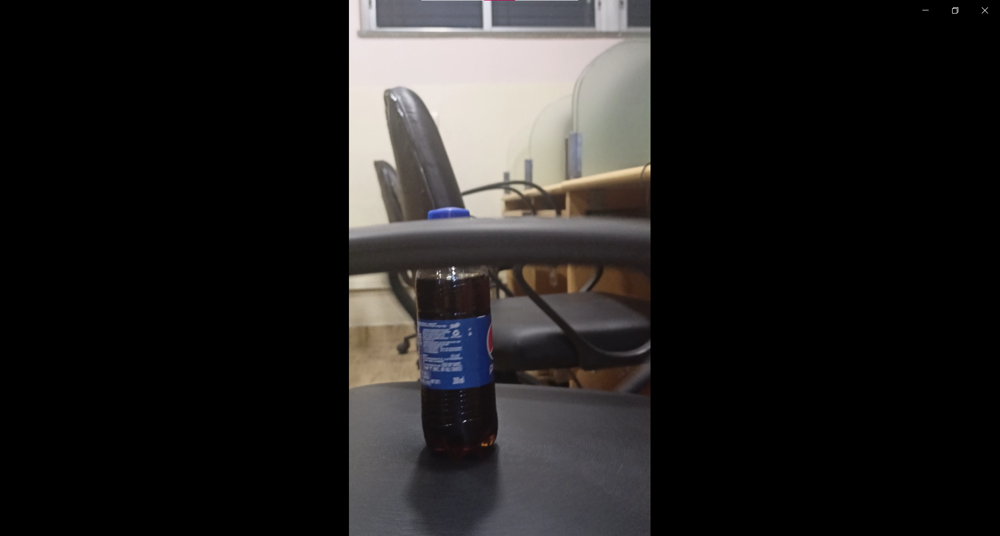

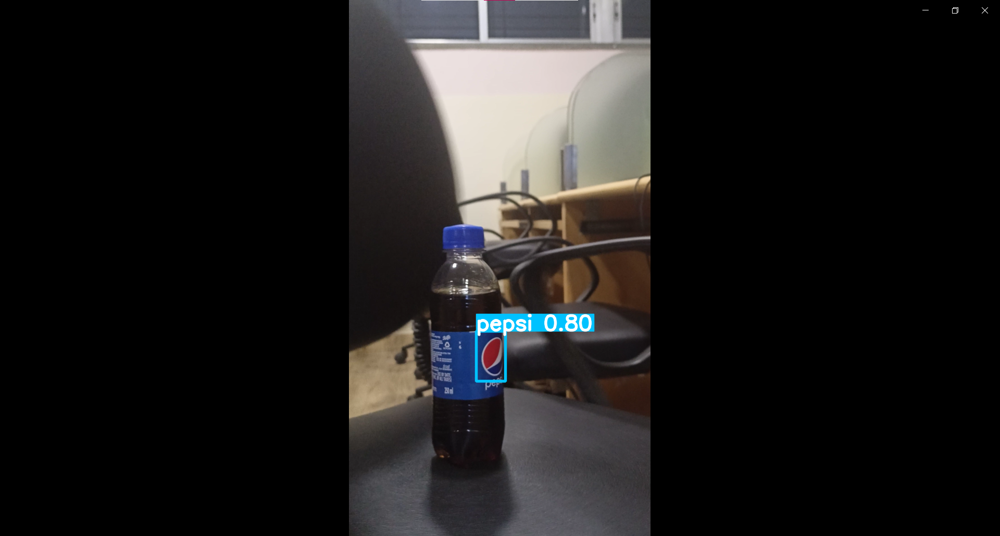

In [8]:
import os

directory = os.fsencode(FOLDER_PATH)

for file in os.listdir(directory):
    filename = os.fsdecode(file)

    # temp_image = cv2.imread(FOLDER_PATH + filename)

    # print(type(temp_image))

    # temp_image = temp_image[bounding_box[1] - 50: bounding_box[3] + 50, :]

    results = model(FOLDER_PATH + filename)
    
    results.show()

In [33]:
image = cv2.imread(FOLDER_PATH + str(1) + ".png")

In [34]:
# create object tracker that uses 'CSRT' algorithm
tracker = cv2.TrackerCSRT_create()

In [35]:
# Todo - use the ok variable for error checking
ok = tracker.init(image, bounding_box)

In [36]:
import os

directory = os.fsencode(FOLDER_PATH)

In [37]:
def get_bounding_box(results):
    for box in results.xyxy[0]: 
        xB = int(box[2])
        xA = int(box[0])
        yB = int(box[3])
        yA = int(box[1])

        w = xB - xA
        h = yB - yA

        bounding_box = (xA, yA, xB, yB)
        return bounding_box
    

<class 'numpy.ndarray'>


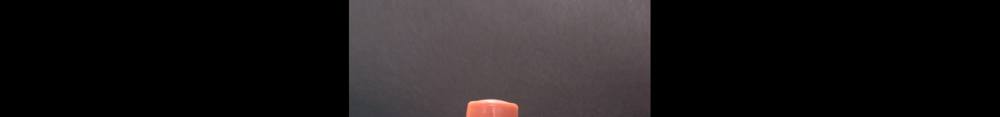

<class 'numpy.ndarray'>


TypeError: 'NoneType' object is not subscriptable

In [39]:
for file in os.listdir(directory):
    filename = os.fsdecode(file)

    temp_image = cv2.imread(FOLDER_PATH + filename)

    print(type(temp_image))

    temp_image = temp_image[bounding_box[1] - 50: bounding_box[3] + 50, :]

    results = model(temp_image)
    
    results.show()

    bounding_box = get_bounding_box(results)

    

In [ ]:
# for file in os.listdir(directory):
#     file_path = FOLDER_PATH + os.fsdecode(file)

#     frame = cv2.imread(file_path)

#     ok, bbox = tracker.update(frame)

#     if ok:
#             # Tracking success
#             p1 = (int(bbox[0]), int(bbox[1]))
#             p2 = (int(bbox[2]), int(bbox[3]))

#             print(p1, p2)

#             result = cv2.rectangle(frame, p1, p2, (255,0,0), 2, 1)

#             cv2.imwrite(f"blurred_{os.fsdecode(file)}", result)
    

    

(882, 507) (988, 630)
(894, 528) (969, 618)
(907, 540) (950, 606)
(903, 535) (969, 618)
(915, 540) (950, 606)
(903, 562) (931, 594)
(918, 598) (950, 606)
(867, 633) (988, 630)
(840, 638) (969, 618)
(849, 635) (969, 618)


: 